## Shipping Optimization

Navigating Trade Turbulence: A Multifaceted Approach to Optimizing Shipping


In the dynamic landscape of global trade, the efficiency and resilience of shipping operations are paramount. Leveraging an array of diverse datasets spanning various domains, from historical shipment records to real-time geopolitical insights, offers a comprehensive approach to optimize shipping strategies. This introduction delineates the fusion of data sources aimed at navigating the complexities of maritime commerce.

First, historical shipment data encapsulates a wealth of information gleaned over a 16-month period, ranging from February 14, 2019, to June 13, 2020. These records meticulously detail shipping timelines, alongside crucial shipment particulars. Notably, the dataset features multiple entries for the same 'shipment_id,' each affiliated with distinct 'shipping_company' entities. The inclusion of the 'selected' column delineates the chosen shipping company or companies, unveiling patterns in selection dynamics.

Second, PortWatch emerges as a pivotal resource, offering real-time monitoring and simulation capabilities to anticipate disruptions in maritime trade flows. Empowered by data sourced from the United Nations Global Platform (UNGP), PortWatch facilitates proactive assessment of trade shocks, from natural disasters to geopolitical instabilities. Its open platform architecture fosters informed decision-making among policymakers and the broader public.

Third, the integration of website scraped data concerning Houthi attacks in the Red Sea illuminates the intricate interplay between geopolitical events and commodity flows. Detailed insights into the impact of such disruptions on oil and commodity prices are paramount for devising agile shipping strategies amidst heightened regional tensions.

Last, the dataset from the Armed Conflict Location & Event Data Project (ACLED) augments our understanding by visualizing events temporally and geospatially. By pinpointing incidents and their geographic ramifications, ACLED elucidates localized impacts, enabling stakeholders to tailor shipping operations accordingly.

This multifaceted approach underscores the imperative of synthesizing diverse datasets to navigate the complexities of global shipping. By harnessing historical insights, real-time monitoring capabilities, geopolitical analyses, and localized event visualization, stakeholders can fortify shipping strategies against volatility and uncertainty in the maritime domain.

https://www.kaggle.com/code/kerneler/starter-1-shipping-optimization-09875804-3 and https://www.kaggle.com/code/barbagrande007/bbb007-shippingcallenge 

# Data Overview Kaggle Shipping Optimization Challenge

Input Dataset
• train_2_pr.csv - contains historical shipments over the 16-month period between 2019-02-14 and 2020-06-13, shipping time, and other shipment details. More than one record in the file might have the same 'shipment_id', but 'shipping_company' for such rows are different. 'shipping_company' reflects potential shipping companies which might be used, and the 'selected' column shows which company (in some cases more than one) has been selected.
shipment_id - Shipment ID
send_timestamp - Date when the order was sent to destination country (in 'source_country' timezone, e.g. UK - GMT)
pick_up_point - Pick Up Point abbreviation
drop_off_point - Drop Off Point abbreviation
source_country - Country from where the goods need to be shipped
destination_country - Country to where the goods need to be shipped
freight_cost - Cost of transportation/kg
gross_weight - Gross weight in kg which needs to be shipped
shipment_charges - Fixed cost per shipment
shipment_mode - Method of shipment (e.g. air, ocean)
shipping_company - Candidate shipping company
selected - Whether the company in 'shipping_company' was selected or not
shipping_time - The amount of time that it takes for goods to reach their destination

• shipping_companies_details_1.csv - File that contains all necessary information about shipping companies.
source_country - Country from where the goods need to be shipped
destination_country - Country to where the goods need to be shipped
shipment_mode - Method of shipment (e.g. air, ocean)
cut_off_time - The time window in which goods can be picked up (e.g. "10 - 2 and 3 - 6 BST" means that pick up is available between the times of 10 a.m. and 2 p.m., and again between the ties of 3 p.m. and 6 p.m). All times are in Bangladesh Standard Time.
tat - Turnaround Time is the time it takes from a package order to shipment. T refers to the time a package was sent, and CO means cut-off time, or the time after which a package can no longer be shipped. "Before CO – T+0" and "After CO – T+1" means that if the goods are sent to the shipping company before the cut off time, then the package will be sent on the same day. If the package arrives to the shipping company after the cut off time, then it will be shipped out on the following day.
processing_days - Days on which Pick up Point works.
pick_up_point - Pick Up Point abbreviation
drop_off_point - Drop Off Point abbreviation
min_sc - Minimum cost of shipment
max_sc - Maximum cost of shipment
shipping_company - Name of shipping company
shipment_charges - Fixed cost per shipment

• test_2.csv - File that contains historical shipment data. Shipping Time is unknown and should be predicted.
shipment_id - Shipment ID
send_timestamp - Date when the order was sent to destination country (in 'source_country' timezone, e.g. UK - GMT)
pick_up_point - Pick Up Point abbreviation
drop_off_point - Drop Off Point abbreviation
source_country - Country from which the goods need to be shipped
destination_country - Country to where the goods need to be shipped
freight_cost - Cost of transportation/kg
gross_weight - Gross weight in kg which needs to be shipped
shipment_charges - Fixed cost per shipment
shipment_mode - Method of shipment (e.g. air, ocean)
shipping_company - Candidate shipping company
selected - Whether the company in 'shipping_company' was selected or not

In [1]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt # plotting
import numpy as np # linear algebra
import os # accessing directory structure
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [2]:
train = pd.read_csv("/Users/JohnWishart/Desktop/Shipping/train_2_pr.csv",index_col="shipment_id",parse_dates=["send_timestamp"])
test = pd.read_csv("/Users/JohnWishart/Desktop/Shipping/test_2.csv",index_col="shipment_id",parse_dates=["send_timestamp"])
submit = pd.read_csv("/Users/JohnWishart/Desktop/Shipping/submission_2.csv")

In [3]:
train.head()

,Unnamed: 0,send_timestamp,pick_up_point,drop_off_point,source_country,destination_country,freight_cost,gross_weight,shipment_charges,shipment_mode,shipping_company,selected,shipping_time
shipment_id,,,,,,,,,,,,,
S000720,0,2019-06-08 07:17:51,A,Y,GB,IN,88.61,355.0,0.75,Air,SC3,Y,5.00741
S000725,1,2019-07-12 15:23:21,A,Y,GB,IN,85.65,105.0,0.90,Ocean,SC1,Y,21.41215
S000736,2,2019-10-04 14:23:29,A,Y,GB,IN,86.22,100.0,0.75,Air,SC3,Y,5.33692
S000738,3,2020-01-07 09:19:50,A,Y,GB,IN,94.43,1071.0,1.05,Air,SC2,Y,5.14792
S000739,4,2020-04-11 06:36:03,A,Y,GB,IN,94.24,2007.0,0.75,Air,SC3,Y,5.03067


## Exploratory Data Analysis

In [4]:
# create summary of the train dataset columns
# missing values, unique values, type etc.

def summary(df):
    summary = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name', 'dtypes']]
    summary['Missing'] = df.isnull().sum().values
    summary['Uniques'] = df.nunique().values
    return summary

summary(train)


,Name,dtypes,Missing,Uniques
0,Unnamed: 0,int64,0,5114
1,send_timestamp,datetime64[ns],0,4804
2,pick_up_point,object,0,1
3,drop_off_point,object,0,2
4,source_country,object,0,1
5,destination_country,object,0,2
6,freight_cost,float64,0,2000
7,gross_weight,float64,0,1301
8,shipment_charges,float64,0,5
9,shipment_mode,object,0,2


# Visualize the Data

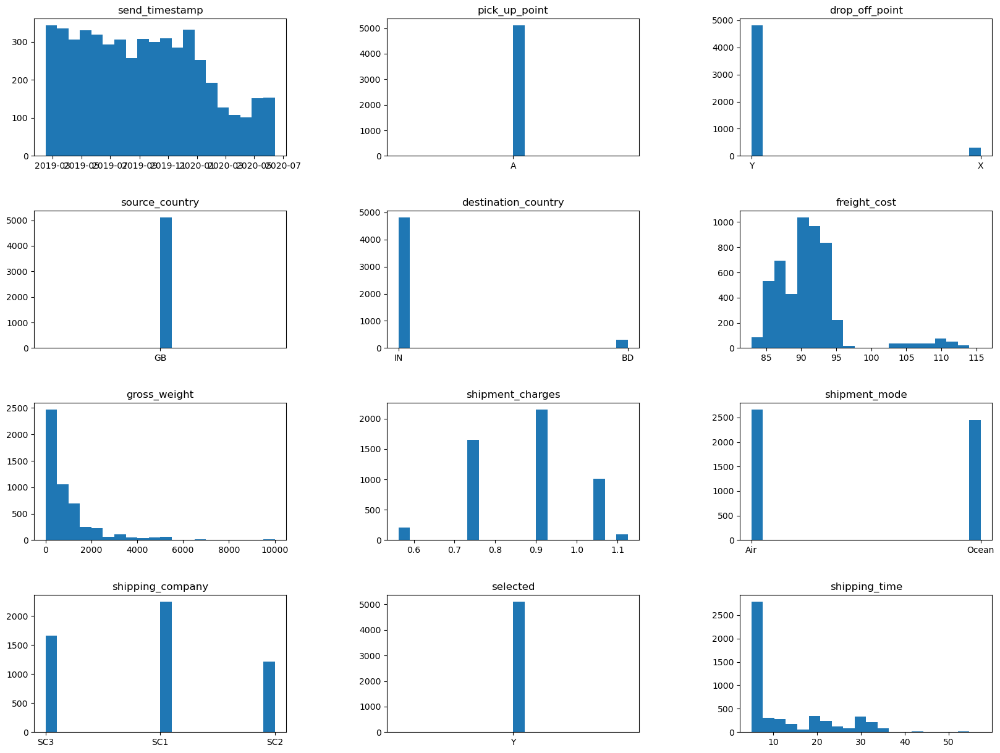

In [5]:
# Distribution graphs (histogram/bar graph) of columns in the train set
fig = plt.figure(figsize=(20, 15))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(1, train.shape[1]):
    ax = fig.add_subplot(4, 3, i)
    ax.hist(train.iloc[:,i], bins=20)
    ax.title.set_text(train.columns[i])
plt.show()


In [6]:
# Correlation matrix of the train set
# Identify non-numeric columns
non_numeric_columns = train.select_dtypes(exclude=['number']).columns

# Decide whether to remove them or convert them to numeric
# Option 1: Remove non-numeric columns
train_numeric = train.drop(columns=non_numeric_columns)

# Option 2: Convert non-numeric columns to numeric if possible
train_numeric = train.copy()
for column in non_numeric_columns:
    try:
        train_numeric[column] = pd.to_numeric(train_numeric[column])
    except ValueError:
        # Handle the case where conversion to numeric is not possible
        # For example, if the column contains non-numeric strings that cannot be converted
        train_numeric = train_numeric.drop(columns=column)

# Proceed with computing the correlation matrix
correlation_matrix = train_numeric.corr()

# Display the correlation matrix
correlation_matrix



,Unnamed: 0,send_timestamp,freight_cost,gross_weight,shipment_charges,shipping_time
Unnamed: 0,1.000000,-0.037052,0.334030,0.401813,-0.065882,0.268320
send_timestamp,-0.037052,1.000000,0.213464,-0.055998,0.068863,-0.132467
freight_cost,0.334030,0.213464,1.000000,-0.058461,-0.185397,0.172070
gross_weight,0.401813,-0.055998,-0.058461,1.000000,0.087362,0.208362
shipment_charges,-0.065882,0.068863,-0.185397,0.087362,1.000000,0.049514
shipping_time,0.268320,-0.132467,0.172070,0.208362,0.049514,1.000000


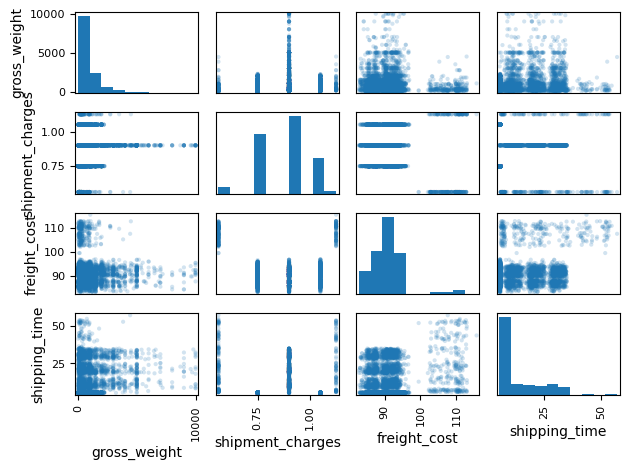

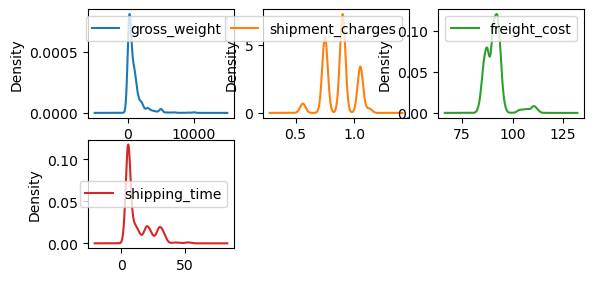

In [7]:
# Scatter and density plots
# Select columns to plot
plot_data = train_numeric[['gross_weight', 'shipment_charges', 'freight_cost', 'shipping_time']]
# Scatter matrix
axes = pd.plotting.scatter_matrix(plot_data, alpha=0.2)
plt.tight_layout()
plt.show()

# Density plot
plot_data.plot(kind='density', subplots=True, layout=(3,3), sharex=False)
plt.show()




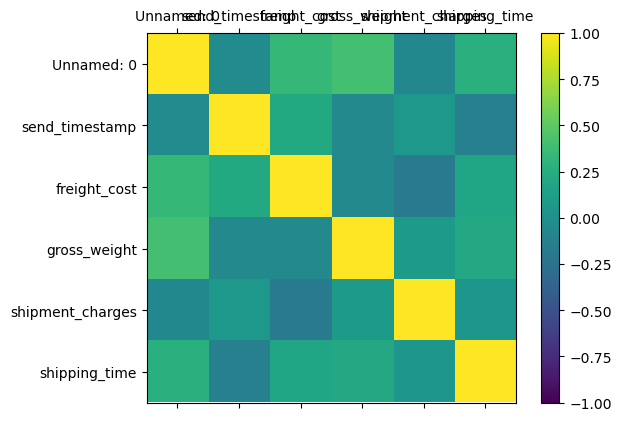

In [8]:


# plot correlation matrix
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlation_matrix, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,train_numeric.shape[1],1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(train_numeric.columns)
ax.set_yticklabels(train_numeric.columns)
plt.show()



In [9]:
import timeit
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.decomposition import PCA

In [10]:
train = pd.read_csv("/Users/JohnWishart/Desktop/Shipping/train_2_pr.csv",index_col="shipment_id",parse_dates=["send_timestamp"])
test = pd.read_csv("/Users/JohnWishart/Desktop/Shipping/test_2.csv",index_col="shipment_id",parse_dates=["send_timestamp"])
submit = pd.read_csv("/Users/JohnWishart/Desktop/Shipping/submission_2.csv")


# reword the above to use the drop function
train = train.drop(columns=['Unnamed: 0'])
test = test.drop(columns=['Unnamed: 0'])



In [11]:
train.head()

,send_timestamp,pick_up_point,drop_off_point,source_country,destination_country,freight_cost,gross_weight,shipment_charges,shipment_mode,shipping_company,selected,shipping_time
shipment_id,,,,,,,,,,,,
S000720,2019-06-08 07:17:51,A,Y,GB,IN,88.61,355.0,0.75,Air,SC3,Y,5.00741
S000725,2019-07-12 15:23:21,A,Y,GB,IN,85.65,105.0,0.90,Ocean,SC1,Y,21.41215
S000736,2019-10-04 14:23:29,A,Y,GB,IN,86.22,100.0,0.75,Air,SC3,Y,5.33692
S000738,2020-01-07 09:19:50,A,Y,GB,IN,94.43,1071.0,1.05,Air,SC2,Y,5.14792
S000739,2020-04-11 06:36:03,A,Y,GB,IN,94.24,2007.0,0.75,Air,SC3,Y,5.03067


In [12]:
def create_summary(df):
    # Create a summary DataFrame with column data types
    summary = pd.DataFrame(df.dtypes, columns=['Data Types'])
    
    # Count missing values for each column
    summary["Missing Values"] = df.isna().sum()
    
    # Count unique values for each column
    summary["Unique Values"] = df.nunique()
    
    # Extract and display three example values from each column
    summary["Example Value 1"] = df.iloc[0]
    summary["Example Value 2"] = df.iloc[1]
    summary["Example Value 3"] = df.iloc[2]
    
    return summary

# Call the create_summary function and apply background gradient styling
create_summary(train).style.background_gradient(cmap='Blues')





,Data Types,Missing Values,Unique Values,Example Value 1,Example Value 2,Example Value 3
send_timestamp,datetime64[ns],0,4804,2019-06-08 07:17:51,2019-07-12 15:23:21,2019-10-04 14:23:29
pick_up_point,object,0,1,A,A,A
drop_off_point,object,0,2,Y,Y,Y
source_country,object,0,1,GB,GB,GB
destination_country,object,0,2,IN,IN,IN
freight_cost,float64,0,2000,88.610000,85.650000,86.220000
gross_weight,float64,0,1301,355.000000,105.000000,100.000000
shipment_charges,float64,0,5,0.750000,0.900000,0.750000
shipment_mode,object,0,2,Air,Ocean,Air
shipping_company,object,0,3,SC3,SC1,SC3


In [13]:
# Drop columns "pick_up_point", "source_country", and "selected" from the train and test dataframes
train = train.drop(["pick_up_point", "source_country", "selected"], axis=1)
test = test.drop(["pick_up_point", "source_country", "selected"], axis=1)

## Analyze and Model the Data

In [14]:
def extract_datetime_features(df):
    # Extract various datetime features from the "send_timestamp" column
    df["year"] = df["send_timestamp"].dt.year
    df["month"] = df["send_timestamp"].dt.month
    df["day"] = df["send_timestamp"].dt.day
    df["dayofweek"] = df["send_timestamp"].dt.day_of_week
    df["dayofyear"] = df["send_timestamp"].dt.day_of_year
    df["hour"] = df["send_timestamp"].dt.hour
    df["minute"] = df["send_timestamp"].dt.minute
    
    # Drop the original "send_timestamp" column
    df = df.drop("send_timestamp", axis=1)
    
    return df

# Apply the function to extract datetime features to both train and test dataframes
train = extract_datetime_features(train)
test = extract_datetime_features(test)


In [15]:
# Separate features (X) and target variable (y) from the training data
X = train.drop("shipping_time", axis=1)
y = train["shipping_time"]

# Create a copy of the test data for prediction
X_test = test.copy()


In [16]:
# Select categorical columns from the feature matrix X
categorical_columns = X.select_dtypes(include=["object", "category"]).columns

# Select continuous columns from the feature matrix X
continuous_columns = X.select_dtypes(include=["int", "float"]).columns

# Combine categorical and continuous columns into a single list
all_columns = list(categorical_columns) + list(continuous_columns)


In [17]:
# Define a list of tuples where each tuple contains:
# - a string identifier for the type of transformation ("cat" for categorical, "cont" for continuous)
# - the transformer object responsible for applying the transformation
# - the list of columns to which the transformation will be applied
transformer_list = [
    ("cat", OneHotEncoder(), categorical_columns),
    ("cont", StandardScaler(), continuous_columns)
]

# Create a ColumnTransformer object that applies different transformations to different columns
ct = ColumnTransformer(transformers=transformer_list)

# Apply the transformations defined in the ColumnTransformer to the feature matrix X
X = ct.fit_transform(X)

# Apply the same transformations to the feature matrix X_test
X_test = ct.transform(X_test)


In [18]:
import numpy as np
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
import pandas as pd
import timeit

# Define the seed
SEED = 42




In [19]:
np.random.seed(SEED)

model_list = [Lasso(random_state=SEED), Ridge(random_state=SEED), ElasticNet(random_state=SEED), RandomForestRegressor(random_state=SEED), 
              AdaBoostRegressor(random_state=SEED), KNeighborsRegressor(), SVR()]

model_name = ["Lasso", "Ridge", "ElasticNet", "RandomForestRegressor", 
              "AdaBoostRegressor", "KNeighborsRegressor", "SVR"]

cv = KFold(n_splits=5, shuffle=True, random_state=SEED)

results = {}

for idx, model in enumerate(model_list):
    start_time = timeit.default_timer()
    score = cross_val_score(model, X, y, scoring="neg_mean_absolute_error", cv=cv)
    end_time = timeit.default_timer() - start_time
    results[model_name[idx]] = np.mean(-score)
    print(f"{model_name[idx]} completed after {end_time:.2f} seconds.")

results_df = pd.DataFrame.from_dict(results, orient="index", columns=["Score"])
results_df = results_df.sort_values(by="Score", ascending=True)
results_df


Lasso completed after 0.02 seconds.
Ridge completed after 0.01 seconds.
ElasticNet completed after 0.01 seconds.
RandomForestRegressor completed after 8.72 seconds.
AdaBoostRegressor completed after 0.25 seconds.
KNeighborsRegressor completed after 0.13 seconds.
SVR completed after 3.83 seconds.


,Score
AdaBoostRegressor,3.773548
SVR,3.884861
RandomForestRegressor,3.900199
KNeighborsRegressor,4.081986
Ridge,4.134984
Lasso,4.914839
ElasticNet,5.898057


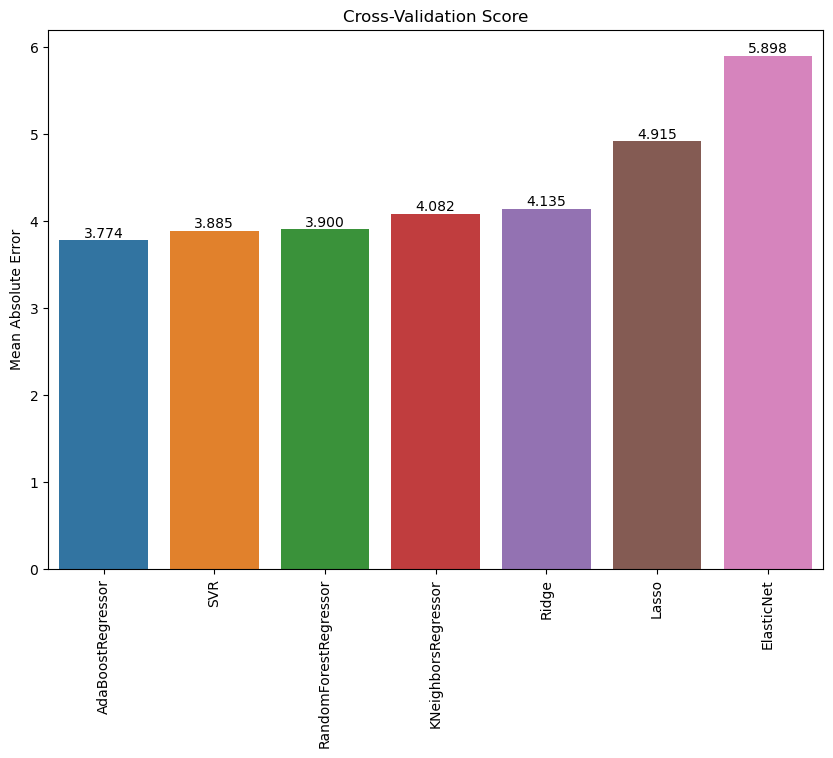

In [20]:
# Create a bar plot for cross-validation scores
fig, ax = plt.subplots(figsize=(10, 7))
sns.barplot(data=results_df, x=results_df.index, y="Score", ax=ax)
# Add labels to the bars
ax.bar_label(ax.containers[-1], fmt='%.3f', label_type='edge')
plt.title("Cross-Validation Score")
plt.xticks(rotation=90)
plt.ylabel("Mean Absolute Error")
plt.xlabel(None)  # No xlabel
plt.show()


The above code conducts a cross-validation evaluation of seven different regression models to measure their mean absolute error (MAE) on a dataset. The evaluation uses 5-fold cross-validation with a specified random seed for reproducibility. The models include Lasso, Ridge, ElasticNet, RandomForestRegressor, AdaBoostRegressor, KNeighborsRegressor, and SVR. A bar plot illustrates the performance of each model, with the AdaBoostRegressor achieving the lowest MAE, indicating the best performance among the tested models. Conversely, the ElasticNet model has the highest MAE, suggesting it performed the worst in this particular evaluation.

In [21]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor

# Split the data into training and development sets
X_train, X_dev, y_train, y_dev = train_test_split(X, y, test_size=0.33, random_state=SEED)

# Define the RandomForestRegressor model
rf = RandomForestRegressor()

# Define the parameter grid for random search
rf_params = {
    "n_estimators": [100, 200, 300],
    "max_depth": [None, 5, 10],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4],
    "random_state": [SEED]
}




In [22]:
# Perform random search using cross-validation
rf_random = RandomizedSearchCV(estimator=rf, param_distributions=rf_params, n_iter=7, cv=3, scoring="neg_mean_absolute_error", verbose=1, random_state=SEED)
rf_random.fit(X_train, y_train)



Fitting 3 folds for each of 7 candidates, totalling 21 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=7,
                   param_distributions={'max_depth': [None, 5, 10],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300],
                                        'random_state': [42]},
                   random_state=42, scoring='neg_mean_absolute_error',
                   verbose=1)

In [23]:
# Get the best parameters for the model
rf_best_params = rf_random.best_params_

# Print the best parameters
print(f"Best parameters for RandomForestRegressor: {rf_best_params}")

Best parameters for RandomForestRegressor: {'random_state': 42, 'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 5}


In [24]:
# Define the best model based on the lowest MAE
best_model_name = results_df.index[0]
best_model_index = model_name.index(best_model_name)
best_model = model_list[best_model_index]

print(f"The best model is: {best_model_name}")


The best model is: AdaBoostRegressor


In [25]:
# Fit the best model with the training data
best_model.fit(X_train, y_train)

# Make predictions on the development set using the best model
y_pred = best_model.predict(X_dev)

# Calculate mean absolute error (MAE) and root mean squared error (RMSE)
mae = mean_absolute_error(y_dev, y_pred)
rmse = mean_squared_error(y_dev, y_pred, squared=False)

# Print the evaluation metrics
print(f"Best Model: {best_model_name}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")



Best Model: AdaBoostRegressor
Mean Absolute Error (MAE): 3.86
Root Mean Squared Error (RMSE): 6.52


The evaluation results reveal that the selected model, AdaBoostRegressor, demonstrates a promising performance on the development dataset. The Mean Absolute Error (MAE) of 3.86 indicates that, on average, the predicted values deviate by approximately 3.86 units from the actual values. Similarly, the Root Mean Squared Error (RMSE) of 6.52 signifies that, on average, the predicted values are off by around 6.52 units from the actual values, with a heavier penalty for larger errors. The model's performance suggests its capability to make reasonably accurate predictions. However, further comparative analysis with alternative models or baseline approaches would provide a more comprehensive understanding of its effectiveness.

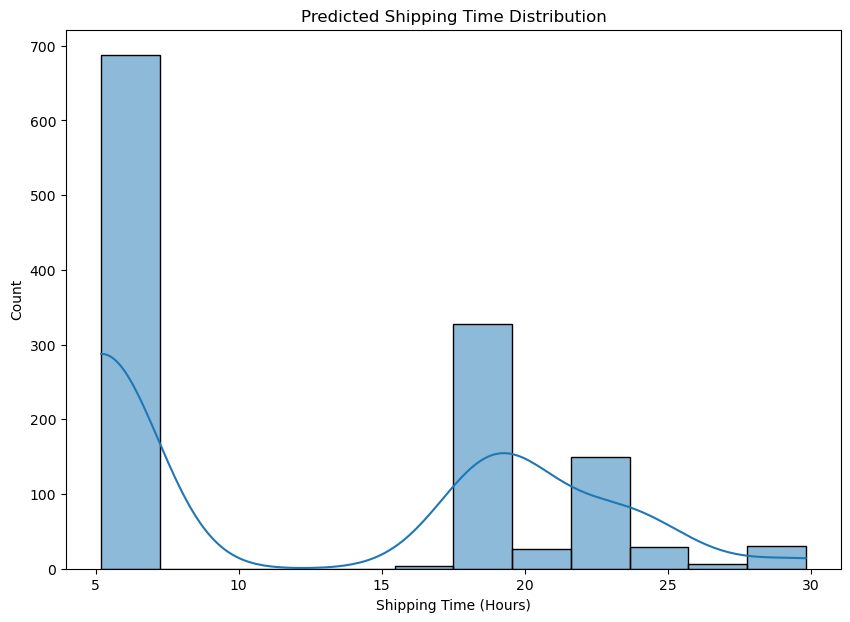

In [26]:
# Fit the best model with the training data
best_model.fit(X_train, y_train)

# Make predictions on the test set using the best model
results = best_model.predict(X_test)

# Assign the predicted shipping times to the test data
test["shipping_time"] = results

# plot the results
fig, ax = plt.subplots(figsize=(10, 7))
sns.histplot(test["shipping_time"], kde=True, ax=ax)
plt.title("Predicted Shipping Time Distribution")
plt.xlabel("Shipping Time (Hours)")
plt.ylabel("Count")
plt.show()





The above details the process of fitting a machine learning model, identified as the 'best model', to training data and then using this model to make predictions on a test dataset. These predictions represent estimated shipping times. A histogram plot has been generated to show the distribution of these predicted shipping times in hours, overlaid with a kernel density estimate (KDE) curve to approximate the probability density of the data. The plot indicates a skewed distribution with a significant number of predictions clustered around lower shipping times, primarily near 5 hours, and fewer as the shipping times increase, with some predictions around 15 and 25 hours.

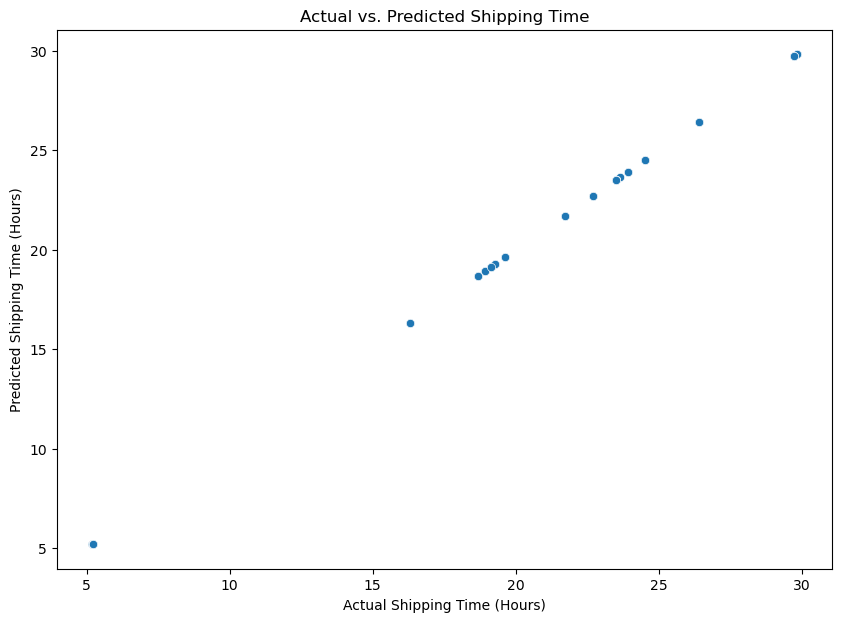

In [27]:
# show actual versus predicted shipping time
fig, ax = plt.subplots(figsize=(10, 7))
sns.scatterplot(data=test, x="shipping_time", y="shipping_time", ax=ax)
plt.title("Actual vs. Predicted Shipping Time")
plt.xlabel("Actual Shipping Time (Hours)")
plt.ylabel("Predicted Shipping Time (Hours)")
plt.show()


# DataSet 2 

PortWatch is an open platform designed to monitor and simulate disruptions to maritime trade flows. The platform helps policymakers and the public assess the impact of realized and future trade shocks, such as natural disasters, based on real-time data sourced from the UNGP. https://portwatch.imf.org/pages/c57c79bf612b4372b08a9c6ea9c97ef0

In [43]:
# read in csv file from desktop and create a pandas dataframe suez-canal-daily-transit.csv with columns datetime, number of cargo ships, and number of tanker ships, 7-day moving average of cargo ships, and 7-day moving average 

suez_df = pd.read_csv("/Users/JohnWishart/Desktop/suez-canal-daily-transit.csv") 


In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# load the dataset
df = pd.read_csv("/Users/JohnWishart/Desktop/suez-canal-daily-transit.csv")

# view the first few rows of the dataset
print(df.head())

# convert the dataframe to lowercase
df.columns = df.columns.str.lower()

# null values in the dataset
print(df.isnull().sum())




              DateTime  Number of Cargo Ships  Number of Tanker Ships  \
0  2019-01-01 00:00:00                     63                      22   
1  2019-01-02 00:00:00                     41                      10   
2  2019-01-03 00:00:00                     41                      24   
3  2019-01-04 00:00:00                     33                      15   
4  2019-01-05 00:00:00                     31                      13   

   7-day Moving Average  Prior Year: 7-day Moving Average  
0                 85.00                               NaN  
1                 68.00                               NaN  
2                 67.00                               NaN  
3                 62.25                               NaN  
4                 58.60                               NaN  
datetime                              0
number of cargo ships                 0
number of tanker ships                0
7-day moving average                  0
prior year: 7-day moving average    366
d

       number of cargo ships  number of tanker ships  7-day moving average  \
count            1905.000000             1905.000000           1905.000000   
mean               41.369554               18.721260             60.150977   
std                 9.060135                6.176543             10.222011   
min                 2.000000                0.000000             16.571429   
25%                35.000000               14.000000             53.000000   
50%                41.000000               18.000000             58.142857   
75%                47.000000               23.000000             69.428571   
max                71.000000               44.000000             85.000000   

       prior year: 7-day moving average  
count                       1539.000000  
mean                          58.439273  
std                            8.029967  
min                           16.571429  
25%                           52.714286  
50%                           56.571429  
75%

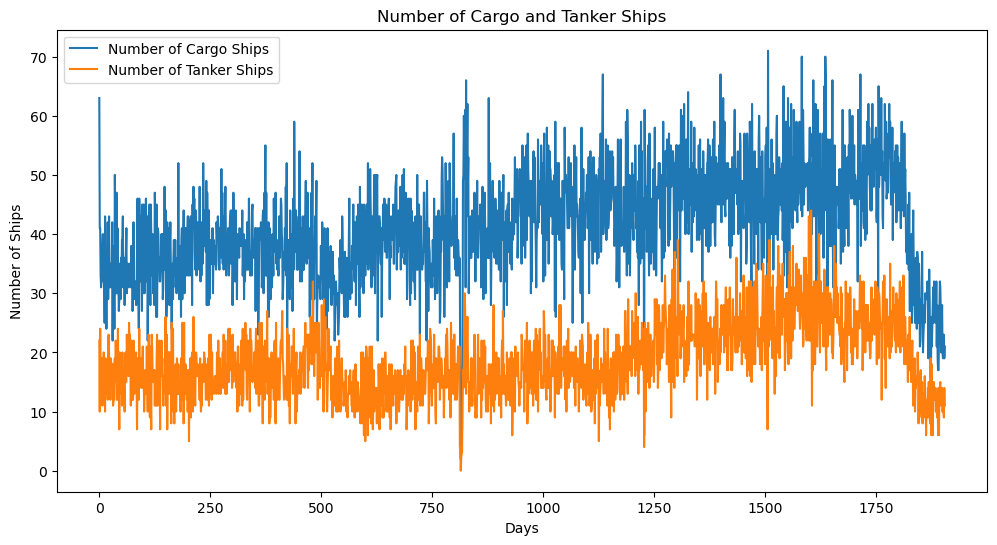

In [68]:
# descriptive statistics of the data set number of cargo ships and number of tanker ships
print(df.describe())

# plot the number of cargo ships and number of tanker ships
plt.figure(figsize=(12, 6))
plt.plot(df['number of cargo ships'], label='Number of Cargo Ships')
plt.plot(df['number of tanker ships'], label='Number of Tanker Ships')
plt.xlabel('Days')
plt.ylabel('Number of Ships')
plt.title('Number of Cargo and Tanker Ships')
plt.legend()
plt.show()



In [69]:
# data type of the columns
print(df.dtypes)


datetime                             object
number of cargo ships                 int64
number of tanker ships                int64
7-day moving average                float64
prior year: 7-day moving average    float64
dtype: object


In [70]:
print(df.columns)


Index(['datetime', 'number of cargo ships', 'number of tanker ships',
       '7-day moving average', 'prior year: 7-day moving average'],
      dtype='object')


In [71]:
# convert the datetime column to datetime format
df['datetime'] = pd.to_datetime(df['datetime'])

# set the datetime column as the index
df.set_index('datetime', inplace=True)




Mean Squared Error: 33.93186641270587


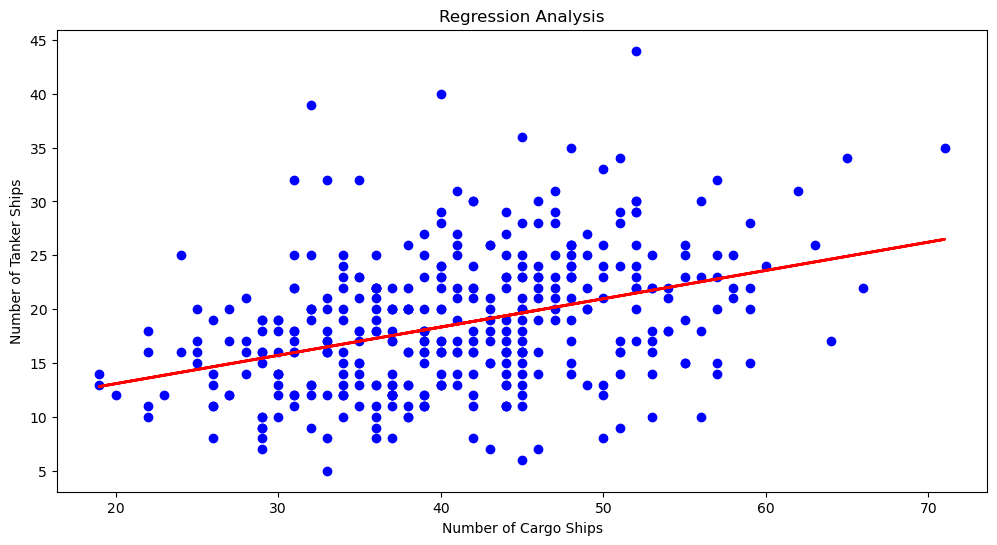

In [72]:
# regression analysis to predict the number of cargo ships and number of tanker ships
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# create a linear regression model
model = LinearRegression()

# split the data into features and target variable
X = df[['number of cargo ships']]
y = df['number of tanker ships']

# split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# fit the model on the training data
model.fit(X_train, y_train)

# make predictions on the test data
y_pred = model.predict(X_test)

# calculate the mean squared error
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# plot the regression line
plt.figure(figsize=(12, 6))
plt.scatter(X_test, y_test, color='blue')
plt.plot(X_test, y_pred, color='red', linewidth=2)
plt.xlabel('Number of Cargo Ships')
plt.ylabel('Number of Tanker Ships')
plt.title('Regression Analysis')
plt.show()


The provided scatter plot illustrates a regression analysis where the number of tanker ships is predicted based on the number of cargo ships. A linear regression model is trained using 80% of the data and tested on the remaining 20%, with a mean squared error (MSE) of approximately 33.93. The plot shows a positive correlation between the two variables, indicating that as the number of cargo ships increases, the number of tanker ships tends to increase as well. The red line on the plot represents the linear regression model's predictions, suggesting a trend but with a notable spread of data points around the line. The MSE is a measure of the model's accuracy, quantifying the average squared difference between the predicted and actual values.

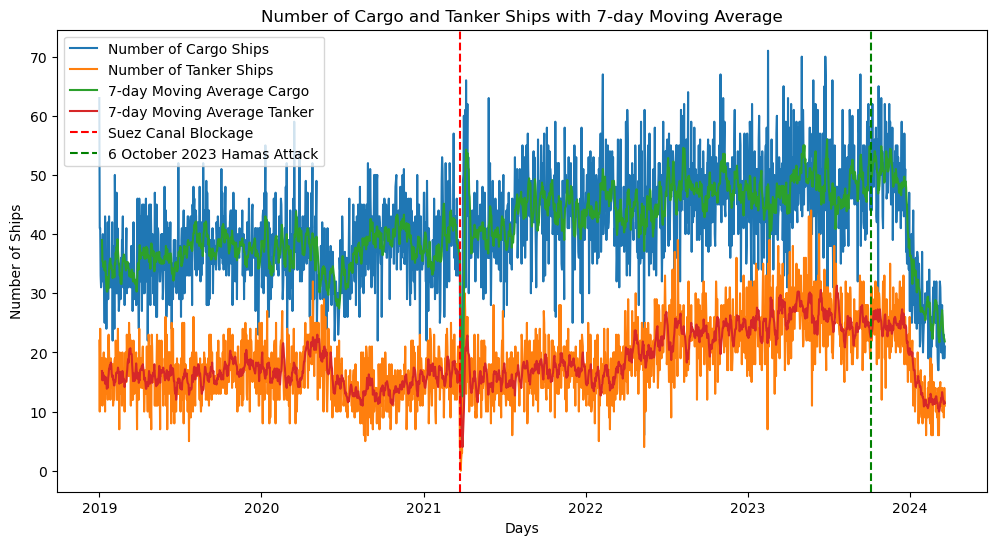

In [79]:
# plot the 7 day moving average over time
df['7-day moving average cargo'] = df['number of cargo ships'].rolling(window=7).mean()
df['7-day moving average tanker'] = df['number of tanker ships'].rolling(window=7).mean()



# add the following to the plot: Suez Canal Blockage and 6 October 2023 Hamas Attack
# Suez Canal Blockage: March 2021
# 6 October 2023 Hamas Attack: October 2023

plt.figure(figsize=(12, 6))
plt.plot(df['number of cargo ships'], label='Number of Cargo Ships')
plt.plot(df['number of tanker ships'], label='Number of Tanker Ships')
plt.plot(df['7-day moving average cargo'], label='7-day Moving Average Cargo')
plt.plot(df['7-day moving average tanker'], label='7-day Moving Average Tanker')
plt.axvline(pd.to_datetime('2021-03-23'), color='r', linestyle='--', label='Suez Canal Blockage')
plt.axvline(pd.to_datetime('2023-10-06'), color='g', linestyle='--', label='6 October 2023 Hamas Attack')
plt.xlabel('Days')
plt.ylabel('Number of Ships')
plt.title('Number of Cargo and Tanker Ships with 7-day Moving Average')
plt.legend()
plt.show()










Quite easy to see the impact on transit times through the Suez Canal and Red Sea the major disruptions in 2021 and late 2023. 

# Data set 3 RSS feed

Natural languare processing and event-based data

In [80]:
import feedparser
import folium

# Function to scrape Yemen and Houthi attacks on shipping from BBC RSS feed
def scrape_attacks_from_rss(feed_url):
    attacks = []
    feed = feedparser.parse(feed_url)
    for entry in feed.entries:
        if 'Yemen' in entry.title or 'Houthi' in entry.title:
            attack = {
                'title': entry.title,
                'description': entry.description,
                'link': entry.link,
                # Add more fields as needed
            }
            attacks.append(attack)
    return attacks

# RSS feed URL for BBC News
rss_feed_url = 'http://feeds.bbci.co.uk/news/world/middle_east/rss.xml'

# Scrape Yemen and Houthi attacks on shipping from the RSS feed
attacks = scrape_attacks_from_rss(rss_feed_url)

# Create a map
map_center = [15.5527, 48.5164]  # Coordinates of Yemen
mymap = folium.Map(location=map_center, zoom_start=6)

# Yemen coordinates (as placeholders)
latitude = 15.5527
longitude = 48.5164

# Add markers for each attack
for attack in attacks:
    popup = f"<b>{attack['title']}</b><br/>{attack['description']}<br/><a href='{attack['link']}' target='_blank'>More Info</a>"
    folium.Marker(
        location=[latitude, longitude],  # Use Yemen coordinates as placeholders
        popup=popup,
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(mymap)


# Add markers for each attack
for attack in attacks:
    popup = f"<b>{attack['title']}</b><br/>{attack['description']}<br/><a href='{attack['link']}' target='_blank'>More Info</a>"
    folium.Marker(
        location=[latitude, longitude],  # Add coordinates of the attack
        popup=popup,
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(mymap)

# Save the map to an HTML file
mymap.save('attacks_map.html')

print("Map generated successfully.")

# open the map in a new tab
import webbrowser
webbrowser.open_new_tab('attacks_map.html')

# show the map
mymap



Map generated successfully.


# Data set 4
NLP and ACLED API data from OCT 2023 to MAR 2023 of Yemen-specific data.

In [81]:
import requests

# Define the URL with parameters
url = "https://api.acleddata.com/acled/read/?key=!eRwYFG-b0jVY0EI0nx9&email=jwishart@syr.edu&country=Yemen&last_event_date=2023-10-01|2024-03-01"

# Send a GET request to the URL
response = requests.get(url)

# Check if the request was successful (status code 200)
if response.status_code == 200:
    # Get the content of the response (the file content)
    file_content = response.text

    # Now you can process the file content as needed
    # For example, you can print it
    print(file_content)
else:
    print("Failed to retrieve data. Status code:", response.status_code)

# view the first 500 characters of the file content
print(file_content[:500])



{"status":200,"success":true,"last_update":19,"count":5000,"messages":[],"data":[{"event_id_cnty":"YEM86334","event_date":"2024-03-22","year":"2024","time_precision":"1","disorder_type":"Political violence","event_type":"Explosions\/Remote violence","sub_event_type":"Shelling\/artillery\/missile attack","actor1":"Military Forces of Yemen (2017-) Houthi","assoc_actor_1":"","inter1":"1","actor2":"","assoc_actor_2":"","inter2":"0","interaction":"10","civilian_targeting":"","iso":"887","region":"Middle East","country":"Yemen","admin1":"","admin2":"","admin3":"","location":"South Red Sea","latitude":"16.1382","longitude":"41.4067","geo_precision":"3","source":"USCENTCOM","source_scale":"Other","notes":"On 22 March 2024, between 4:20 am and 11:10 pm Sanaa time, suspected Houthi forces launched 4 anti-ship ballistic missiles in the South Red Sea. There were no fatalities or injuries as the missiles impacted the water. Potential targets were unidentified\/not reported. Houthi forces did not cl

This code utilizes the `requests` library in Python to access data from the ACLED API. It constructs a URL with specific parameters to retrieve information about events in Yemen within a specified timeframe. The script sends a GET request to the constructed URL and checks the response status code to ensure the request was successful. If the request is successful, it retrieves and prints the content of the response, allowing for further processing of the data.

In [82]:
# clean the data
import json
data = json.loads(file_content)
print(data.keys())
print(data['status'])

# print the first 5 records
print(data['data'][:5])


dict_keys(['status', 'success', 'last_update', 'count', 'messages', 'data', 'filename'])
200
[{'event_id_cnty': 'YEM86334', 'event_date': '2024-03-22', 'year': '2024', 'time_precision': '1', 'disorder_type': 'Political violence', 'event_type': 'Explosions/Remote violence', 'sub_event_type': 'Shelling/artillery/missile attack', 'actor1': 'Military Forces of Yemen (2017-) Houthi', 'assoc_actor_1': '', 'inter1': '1', 'actor2': '', 'assoc_actor_2': '', 'inter2': '0', 'interaction': '10', 'civilian_targeting': '', 'iso': '887', 'region': 'Middle East', 'country': 'Yemen', 'admin1': '', 'admin2': '', 'admin3': '', 'location': 'South Red Sea', 'latitude': '16.1382', 'longitude': '41.4067', 'geo_precision': '3', 'source': 'USCENTCOM', 'source_scale': 'Other', 'notes': 'On 22 March 2024, between 4:20 am and 11:10 pm Sanaa time, suspected Houthi forces launched 4 anti-ship ballistic missiles in the South Red Sea. There were no fatalities or injuries as the missiles impacted the water. Potential 

In [83]:
# convert the data to a pandas dataframe
import pandas as pd
df = pd.DataFrame(data['data'])
print(df.head())


  event_id_cnty  event_date  year time_precision       disorder_type  \
0      YEM86334  2024-03-22  2024              1  Political violence   
1      YEM86358  2024-03-22  2024              1      Demonstrations   
2      YEM86402  2024-03-22  2024              1      Demonstrations   
3      YEM86423  2024-03-22  2024              1      Demonstrations   
4      YEM86438  2024-03-22  2024              1      Demonstrations   

                   event_type                     sub_event_type  \
0  Explosions/Remote violence  Shelling/artillery/missile attack   
1                    Protests                   Peaceful protest   
2                    Protests                   Peaceful protest   
3                    Protests                   Peaceful protest   
4                    Protests                   Peaceful protest   

                                    actor1  \
0  Military Forces of Yemen (2017-) Houthi   
1                       Protesters (Yemen)   
2                   

0    On 22 March 2024, between 4:20 am and 11:10 pm...
1    On 22 March 2024, protesters held a large Hout...
2    On 22 March 2024, protesters held a large Hout...
3    On 22 March 2024, protesters held a large Hout...
4    On 22 March 2024, residents of the eastern dis...
Name: notes, dtype: object


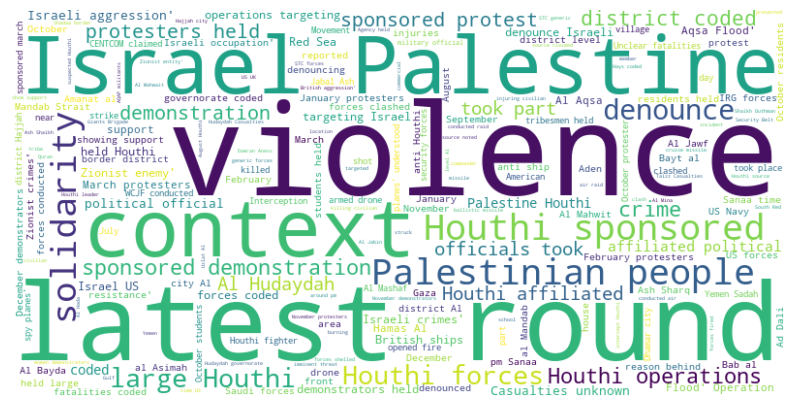

In [84]:
# extract the 'notes' column and print the first 5 records

notes = df['notes']
print(notes[:5])

# create a word cloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Join the text together
all_notes = " ".join(notes.dropna())

# Create a WordCloud object
wordcloud = WordCloud(width=800, height=400, max_words=200, background_color='white').generate(all_notes)

# Display the word cloud
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


In the word cloud above, key terms such as "violence," "Palestinian," "Houthi," "Israel," "context," "sponsored," and "denounce" are prominently displayed, suggesting these words are central to the text source used to generate the cloud. This suggests that the content from which the word cloud was created likely involves discussions around conflict, with a focus on the Israeli-Palestinian situation and possibly the involvement of the Houthi group. The repeated appearance of words related to 'demonstrations', 'forces', and 'casualties' indicates a discourse rich in references to military, political unrest, and public responses to these events.

  event_id_cnty  event_date  year time_precision       disorder_type  \
0      YEM86334  2024-03-22  2024              1  Political violence   
1      YEM86358  2024-03-22  2024              1      Demonstrations   
2      YEM86402  2024-03-22  2024              1      Demonstrations   
3      YEM86423  2024-03-22  2024              1      Demonstrations   
4      YEM86438  2024-03-22  2024              1      Demonstrations   

                   event_type                     sub_event_type  \
0  Explosions/Remote violence  Shelling/artillery/missile attack   
1                    Protests                   Peaceful protest   
2                    Protests                   Peaceful protest   
3                    Protests                   Peaceful protest   
4                    Protests                   Peaceful protest   

                                    actor1  \
0  Military Forces of Yemen (2017-) Houthi   
1                       Protesters (Yemen)   
2                   

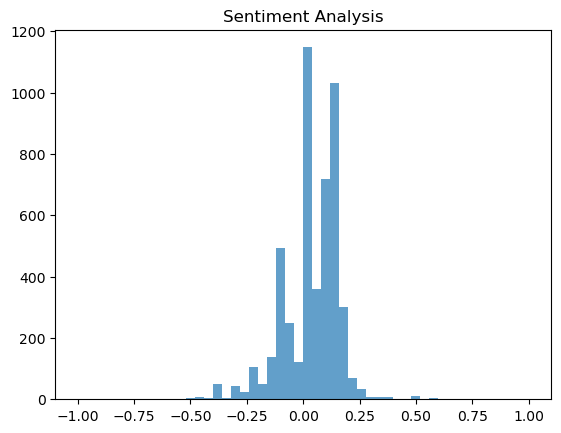

In [85]:
# analyze sentiment of the notes
from textblob import TextBlob

# Create a function to get the polarity
def get_polarity(text):
    return TextBlob(text).sentiment.polarity

# Apply the function to the notes
df['polarity'] = df['notes'].apply(get_polarity)

# Print the first 5 rows of the DataFrame
print(df.head())

# Plot the polarity
plt.hist(df['polarity'], bins=50, range=(-1, 1), alpha=0.7)
plt.title('Sentiment Analysis')
plt.show()



Employs the `TextBlob` library in Python to analyze the sentiment of textual notes. It defines a function called `get_polarity` that computes the polarity of a given text using TextBlob's sentiment analysis capabilities. The function is then applied to the 'notes' column of a DataFrame, storing the polarity scores in a new column named 'polarity'. The DataFrame is then displayed, showing the first 5 rows along with the calculated polarity scores. Additionally, the sentiment polarity distribution is visualized using a histogram, allowing for a quick overview of the sentiment distribution in the data.

The bar chart plots the frequency of sentiment scores that range from -1.00 to 1.00. These scores typically represent the sentiment of texts, where -1.00 would indicate extremely negative sentiment, 0 would be neutral, and 1.00 would be extremely positive. The distribution of scores has a clear concentration around the 0 mark, with the highest peak just above 0, indicating that the majority of the analyzed texts are considered to be slightly positive. There are fewer texts with negative sentiment scores, and very few texts with extremely positive or negative sentiments. This could suggest that the texts are generally neutral to slightly positive in sentiment, with extremes being less common.

In [86]:
# conduct Latent Dirichlet Allocation (LDA) of the notes dataframe to identify topics
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Create a CountVectorizer object
vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')

# Apply the vectorizer to the notes
X = vectorizer.fit_transform(notes.dropna())

# Create an LDA model
lda = LatentDirichletAllocation(n_components=5, random_state=42)

# Fit the LDA model
lda.fit(X)


LatentDirichletAllocation(n_components=5, random_state=42)

Latent Dirichlet Allocation, or LDA for short, is an unsupervised machine learning algorithm. Similar to the clustering algorithm K-means, LDA will attempt to group words and documents into a predefined number of clusters (i.e. topics). These topics can then be used to organize and search through documents. 

https://medium.com/@corymaklin/latent-dirichlet-allocation-dfcea0b1fddc#:~:text=Latent%20Dirichlet%20Allocation%2C%20or%20LDA%20for%20short%2C%20is%20an%20unsupervised,organize%20and%20search%20through%20documents.

In [87]:
# Function to print the top words for each topic
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = f"Topic #{topic_idx}: "
        message += " ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()

# Get the feature names from the vocabulary
feature_names = vectorizer.get_feature_names_out()

# Print the top words for each topic
print_top_words(lda, feature_names, 10)


Topic #0: al houthi forces 2023 coded 2024 district reported security city
Topic #1: coded forces 2023 al district houthi casualties unknown taizz september
Topic #2: houthi israel al held palestinian palestine round violence latest context
Topic #3: al houthi held palestinian palestine violence latest people round context
Topic #4: ship aden houthi forces sea attack 2024 missiles red interception



  event_id_cnty  event_date  year time_precision       disorder_type  \
0      YEM86334  2024-03-22  2024              1  Political violence   
1      YEM86358  2024-03-22  2024              1      Demonstrations   
2      YEM86402  2024-03-22  2024              1      Demonstrations   
3      YEM86423  2024-03-22  2024              1      Demonstrations   
4      YEM86438  2024-03-22  2024              1      Demonstrations   

                   event_type                     sub_event_type  \
0  Explosions/Remote violence  Shelling/artillery/missile attack   
1                    Protests                   Peaceful protest   
2                    Protests                   Peaceful protest   
3                    Protests                   Peaceful protest   
4                    Protests                   Peaceful protest   

                                    actor1  \
0  Military Forces of Yemen (2017-) Houthi   
1                       Protesters (Yemen)   
2                   

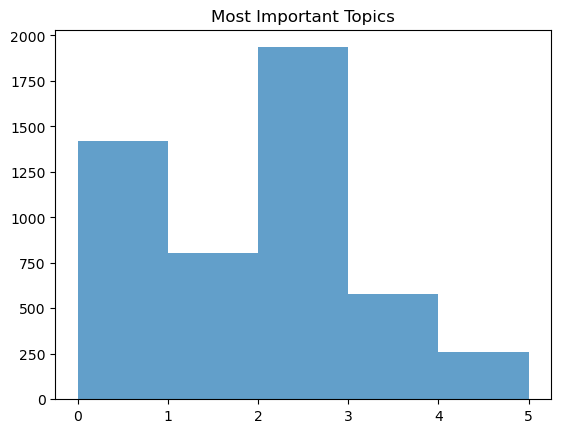

In [88]:
# what else with LDA?
# Create a function to extract the most important topic for each document
def get_most_important_topic(lda_model, X):
    # Get the topic distribution for each document
    topic_distribution = lda_model.transform(X)
    
    # Get the index of the most important topic for each document
    most_important_topic = topic_distribution.argmax(axis=1)
    
    return most_important_topic 

# Apply the function to the notes
df['most_important_topic'] = get_most_important_topic(lda, X)

# Print the first 5 rows of the DataFrame
print(df.head())

# Plot the most important topics
plt.hist(df['most_important_topic'], bins=5, range=(0, 5), alpha=0.7)
plt.title('Most Important Topics')
plt.show()





In [89]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/johnwishart/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/johnwishart/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [90]:
# tokenize the notes section
from nltk.tokenize import word_tokenize

# Tokenize the text
tokens = word_tokenize(all_notes)

# Print the first 10 tokens
print(tokens[:10])

# convert the tokens to lowercase
# Convert the tokens to lowercase
lower_tokens = [t.lower() for t in tokens]

# Print the first 10 tokens
print(lower_tokens[:10])

# get rid of punctuation
from nltk.tokenize import RegexpTokenizer

# Create a tokenizer
tokenizer = RegexpTokenizer(r'\w+')

# Tokenize the text
tokens = tokenizer.tokenize(all_notes)

# Print the first 10 tokens
print(tokens[:10])

# get rid of stopwords
from nltk.corpus import stopwords

# Get the English stop words
stop_words = set(stopwords.words('english'))

# Remove the stop words
tokens = [t for t in tokens if t not in stop_words]

# Print the first 10 tokens

print(tokens[:10])

['On', '22', 'March', '2024', ',', 'between', '4:20', 'am', 'and', '11:10']
['on', '22', 'march', '2024', ',', 'between', '4:20', 'am', 'and', '11:10']
['On', '22', 'March', '2024', 'between', '4', '20', 'am', 'and', '11']
['On', '22', 'March', '2024', '4', '20', '11', '10', 'pm', 'Sanaa']


[('Houthi', 6765), ('Al', 6221), ('On', 4915), ('coded', 3491), ('Israel', 3159), ('2023', 2993), ('held', 2668), ('forces', 2662), ('Palestinian', 2356), ('Palestine', 2354), ('round', 2347), ('latest', 2344), ('violence', 2344), ('context', 2337), ('people', 2328), ('sponsored', 2268), ('solidarity', 2158), ('district', 2116), ('2024', 2037), ('denounce', 1864), ('crimes', 1728), ('demonstration', 1600), ('Israeli', 1395), ('large', 1262), ('US', 1241), ('al', 1149), ('protest', 1143), ('operations', 1138), ('protesters', 1122), ('1', 1053), ('took', 971), ('city', 957), ('part', 916), ('affiliated', 901), ('The', 881), ('aggression', 861), ('October', 841), ('Hudaydah', 834), ('Sanaa', 816), ('officials', 814), ('Zionist', 795), ('political', 794), ('February', 760), ('January', 711), ('targeting', 702), ('As', 663), ('Taizz', 654), ('British', 635), ('2', 623), ('March', 615)]


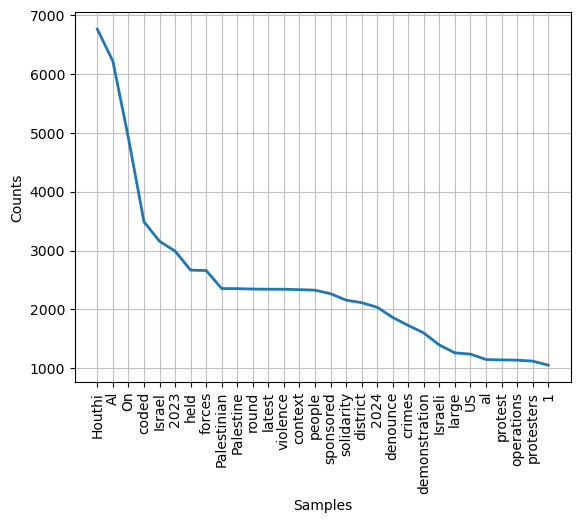

[(('latest', 'round'), 2341), (('round', 'violence'), 2341), (('violence', 'Israel'), 2341), (('Israel', 'Palestine'), 2341), (('context', 'latest'), 2336), (('Palestinian', 'people'), 2274), (('Houthi', 'sponsored'), 2268), (('solidarity', 'Palestinian'), 2123), (('Palestine', 'On'), 1390), (('held', 'large'), 1226), (('Houthi', 'forces'), 1197), (('large', 'Houthi'), 1151), (('Houthi', 'operations'), 1083), (('held', 'Houthi'), 1080), (('district', 'coded'), 1030), (('denounce', 'crimes'), 987), (('people', 'Houthi'), 970), (('protesters', 'held'), 964), (('Al', 'Hudaydah'), 832), (('took', 'part'), 818), (('October', '2023'), 817), (('Houthi', 'affiliated'), 810), (('crimes', 'Israeli'), 793), (('part', 'demonstration'), 793), (('officials', 'took'), 783), (('affiliated', 'political'), 763), (('coded', 'Al'), 755), (('February', '2024'), 754), (('demonstration', 'On'), 743), (('sponsored', 'demonstration'), 737), (('2024', 'protesters'), 730), (('sponsored', 'protest'), 728), (('Jan

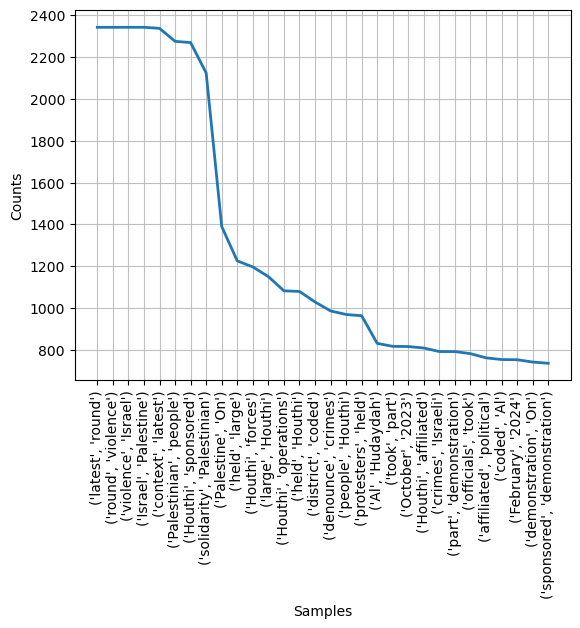

<Axes: xlabel='Samples', ylabel='Counts'>

In [91]:
# create a frequency distribution
from nltk.probability import FreqDist

# Create the frequency distribution
freq_dist = FreqDist(tokens)

# Print the 50 most common tokens
print(freq_dist.most_common(50))

# plot the frequency distribution
freq_dist.plot(30, cumulative=False)

# create a bigram frequency distribution
from nltk.util import bigrams

# Create the bigram frequency distribution
bigram_freq_dist = FreqDist(list(bigrams(tokens)))

# Print the 50 most common bigrams
print(bigram_freq_dist.most_common(50))

# plot the bigram frequency distribution
bigram_freq_dist.plot(30, cumulative=False)

# create a trigram frequency distribution

In [92]:
# plot events by event type and location on a map
import folium
from folium.plugins import MarkerCluster

# Create a map object
m = folium.Map(location=[15, 0], zoom_start=2)

# Create a MarkerCluster object
marker_cluster = MarkerCluster().add_to(m)

# Add a marker for each event
for i in range(0, len(df)):
    location = [df.iloc[i]['latitude'], df.iloc[i]['longitude']]
    event_type = df.iloc[i]['event_type']
    popup = f"{event_type}"
    folium.Marker(
        location,
        popup=popup
    ).add_to(marker_cluster)

# Show the map
m.save('map.html')
m




[*********************100%%**********************]  6 of 6 completed


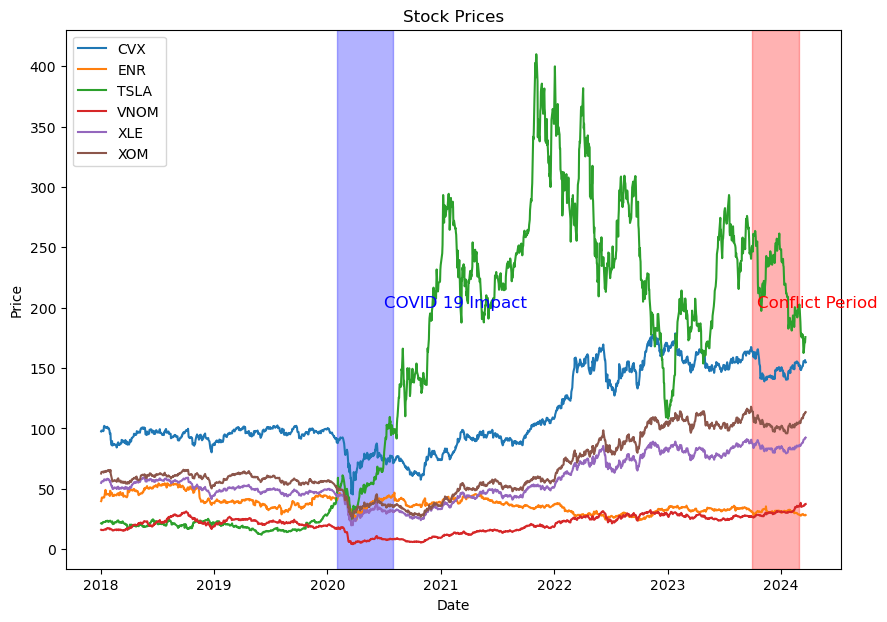

In [87]:
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt

# Get the data for the stock ["XOM", "TSLA", "CVX", "ENR", "VNOM"], START="2018-01-01"
data = yf.download(["XOM", "TSLA", "CVX", "ENR", "VNOM", "XLE"], start="2018-01-01")["Adj Close"]

# Plot the close prices
plt.figure(figsize=(10, 7))
for i in data.columns:
    plt.plot(data[i], label=i)
plt.title("Stock Prices")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()

# Create a shaded area for the conflict period
plt.axvspan(pd.Timestamp('2023-10-01'), pd.Timestamp('2024-03-01'), color='red', alpha=0.3)
plt.text(pd.Timestamp('2023-10-15'), 200, 'Conflict Period', fontsize=12, color='red')

# Create a shaded area for COVID 19 impact
plt.axvspan(pd.Timestamp('2020-02-01'), pd.Timestamp('2020-07-31'), color='blue', alpha=0.3)
plt.text(pd.Timestamp('2020-07-01'), 200, 'COVID 19 Impact', fontsize=12, color='blue')

plt.show()






In the same vein as world events geogpraphically impact shipping and transit times, stock prices are also impacted as well. 

The geopolitical landscape of the Middle East holds significant strategic importance globally, especially in the energy sector, where instability fueled by actors like the Houthi rebels often leads to fluctuations in oil prices. This study focused into this intricate relationship by leveraging data from the Armed Conflict Location & Event Data Project (ACLED) and financial data from Yahoo Finance to analyze the impact of geopolitical events on both oil prices and stock markets. Through the application of natural language processing techniques, insight were extracted from ACLED data, including sentiment analysis to gauge the market's response to geopolitical events. Spatial analysis will also be employed to map these events to strategic transit chokepoints such as the Suez Canal, Red Sea, and the Strait of Hormuz. Ultimately, the study provided a comprehensive understanding of the intricate interplay between geopolitical events in the Middle East, shipment times, oil prices, and financial markets, offering valuable insights for policymakers, investors, and analysts navigating the complexities of the global energy market and mitigating associated risks.